# Building a Convolutional Neural Network to Classify SEM Images with Flux.jl

The ability to quickly and reliably classify nanoscale structures in large SEM datasets has many potential applications, ranging from process optimization and defect recognition in semiconductor processing to detection of 
specific cells or proteins in biological samples. Deep learning offers a path for efficient parsing of the large amounts of data commonly collected by SEMs. <br><br>
This dataset is a collection of SEM images produced at CNR-IOM in Trieste, Italy, and manually classified into 10 groups, including 0D objects(particles), 1D objects (nanowires and fibers), 2D objects (films and powders) and 3D objects (AFM tips and patterned MEMS structures such as pillars). The dataset is available for download here: https://b2share.eudat.eu/records/19cc2afd23e34b92b36a1dfd0113a89f, and is discussed in detail in this paper: https://www.nature.com/articles/sdata2018172. <br><br>
    Transfer learning using Tensorflow with a pretrained Inception-v3 model was used to reach classification accuracies of up to 90% on a testing set of data in this paper: https://www.nature.com/articles/s41598-017-13565-z.<br><br>

This notebook solves the same problem using Flux.jl, one of Julia's deep learning libraries. The objective is to see if we can reach comparable accuracy with a very simple CNN and smaller dataset, capable of training in several hours on a single CPU.

In [ ]:
ENV["JULIA_CUDA_SILENT"] = true

using Images
using FileIO
using ImageMagick
using QuartzImageIO
using ImageView
using ProgressBars
using Flux, Statistics
using Flux: onehotbatch, onecold, crossentropy, throttle
using Base.Iterators: partition
using Printf, BSON
using Random
using Plots
using Plots.PlotMeasures
using LinearAlgebra
using StaticArrays

In [ ]:
path = "SEM_data/";

## Loading Data:

The following 3 functions load and trim a set of SEM images. The data is divided into labeled folders in the root directory specified by `path`. For each folder in the directory, `load_all` calls `create_training_and_test_data` to load images, while creating a unique label corresponding to images from each folder. <br><br>

`create_training_and_test_data` loads images in the specified folder until a max number of images is reached. In order to quickly benchmark models on a CPU we will keep the number of images to 100 for each group at first. The function then trims the image to 768x768 for easy processing by the ConvNet, and adds the image and its label to images and labels arrays, respectively. Finally, the images and labels are split into training and test data with the supplied ratio by calling `train_test_split`, and the training and test images and labels that are returned are passed back to `load_all`.

In [3]:
function train_test_split(images, labels, ratio)
    @assert length(images) == length(labels)
    @assert 0 < ratio < 1
    separator = trunc(Int, ratio*length(images))
    train_images = images[1:separator]
    train_labels = labels[1:separator]
    test_images = images[separator + 1:length(images)]
    test_labels = labels[separator + 1:length(images)]
    return train_images, train_labels, test_images, test_labels
    end;

In [4]:
function create_training_and_test_data(path, label, ratio = 0.9, max_group_size = 100)
    images = []
    labels = Array{Int64}(undef, 0)
    files = readdir(path)
    for file in files
        if length(labels) >= max_group_size
            break
        end
        
        img = load(string(path, file))
        if size(img) == (768, 1024)
            push!(labels, label)        
            gray_img = Gray.(img)
            gray_img_cropped = gray_img[1:768,1:768]
            push!(images, gray_img_cropped)
        end       
    end
    train_images, train_labels, test_images, test_labels = train_test_split(images, labels, ratio)
    return train_images, train_labels, test_images, test_labels

    end;

In [5]:
function load_all(path, ratio = 0.9, max_group_size = 100)
    label = 0
    train_images = []
    train_labels = Array{Int64}(undef, 0)
    test_images = []
    test_labels = Array{Int64}(undef, 0)
    assignment_dict = Dict()
    for folder in ProgressBar(readdir(path))
        if !startswith(folder, ".")
            folder_path = string(path,folder,"/")
            assignment_dict[folder] = label
            tmp_train_imgs, tmp_train_lbls, tmp_tst_imgs, tmp_tst_lbls = create_training_and_test_data(folder_path, label, ratio, max_group_size)
            train_images = vcat(train_images, tmp_train_imgs)
            train_labels = vcat(train_labels, tmp_train_lbls)
            test_images = vcat(test_images, tmp_tst_imgs)
            test_labels = vcat(test_labels, tmp_tst_lbls)
            label += 1
        end
    end
    return train_images, train_labels, test_images, test_labels, assignment_dict
    end;

In [6]:
train_images, train_labels, test_images, test_labels, assignment_dict = load_all(path, 0.9, 100);

100.0%┣██████████████████████████████████████████████████████████████┫ 11/11 [00:58<00:00, 0.2 it/s]


## Examining the data

In [7]:
assignment_list = Vector{String}(undef, 10)
for (k,v) in assignment_dict
    assignment_list[v+1] = k
    end;

In [8]:
gr()
p1 = plot(train_images[1], title = assignment_list[1])
p2 = plot(train_images[91], title = assignment_list[2])
p3 = plot(train_images[181], title = assignment_list[3])
p4 = plot(train_images[271], title = assignment_list[4])
p5= plot(train_images[361], title = assignment_list[5])
p6 = plot(train_images[451], title = assignment_list[6])
p7 = plot(train_images[541], title = assignment_list[7])
p8 = plot(train_images[631], title = assignment_list[8])
p9 = plot(train_images[721], title = assignment_list[9])
p10 = plot(train_images[811], title = assignment_list[10])
plot(p1,p2,p3,p4,p5,p6,p7,p8,p9,p10, layout = (2,5), size = (2000, 500))
    

## Preparing data for training

We want our minibatches to contain a random sampling of the classes, so here we shuffle the arrays of train and test images and labels. We then make minibatches for the training set, using batch size of 20 for the case of 100 samples of each class, so the 900 image-label pairs in the training set will be evenly divided.

In [9]:
function shuffle_data(train_images, train_labels, test_images, test_labels, generator = 1234)
    train_set = collect(zip(train_images, train_labels))
    test_set = collect(zip(test_images, test_labels));
    rng = MersenneTwister(generator);
    shuffle!(rng, train_set)
    shuffle!(rng, test_set)
    train_images = [x[1] for x in train_set]
    train_labels = [x[2] for x in train_set]
    test_images = [x[1] for x in test_set]
    test_labels = [x[2] for x in test_set]
    return train_images, train_labels, test_images, test_labels
    end;

In [10]:
train_images, train_labels, test_images, test_labels = shuffle_data(train_images,train_labels, test_images, test_labels);

In [11]:
function make_minibatch(X, Y, idxs)
    X_batch = Array{Float32}(undef, size(X[1])..., 1, length(idxs))
    for i in 1:length(idxs)
        X_batch[:,:,:,i] = Float32.(X[idxs[i]])
    end
    Y_batch = onehotbatch(Y[idxs], 0:9)
    return (X_batch, Y_batch)
    end;

In [12]:
batch_size = 32
mb_idxs = partition(1:length(train_images), batch_size)
train_set = [make_minibatch(train_images, train_labels, i) for i in mb_idxs];

In [13]:
test_set = make_minibatch(test_images, test_labels, 1:length(test_images));

## Constructing the Model
The model is built using Flux's Chain method. Since we want a simple model and a relatively small number of parameters, we'll use Conv layers with a stride of 2 and maxpool layers to shrink the input data, before reshaping and using one fully connected layer followed by a softmax to output probabilities of each class.<br><br>

We'll first attempt to overfit the training data with this model, then add regularization.

In [14]:
model = Chain(
    Conv((3,3), 1=>16, pad = (1,1), stride = (2,2), relu),
    MaxPool((2,2)),
    Conv((3,3), 16=>32, pad = (1,1), stride = (2,2), relu),
    MaxPool((2,2)),
    Conv((3,3), 32=>32, pad = (1,1), stride = (2,2), relu),
    MaxPool((2,2)),
    x -> reshape(x, :, size(x,4)),
    Dense(4608,10),
    softmax,
)

Chain(Conv((3, 3), 1=>16, relu), MaxPool((2, 2), pad = (0, 0, 0, 0), stride = (2, 2)), Conv((3, 3), 16=>32, relu), MaxPool((2, 2), pad = (0, 0, 0, 0), stride = (2, 2)), Conv((3, 3), 32=>32, relu), MaxPool((2, 2), pad = (0, 0, 0, 0), stride = (2, 2)), #13, Dense(4608, 10), softmax)

We'll precompile our model by testing it on the first batch. Since we have 10 classes and our batch size is 20 we should get a 10x20 array. Since the model has just been initialized and is untrained, it should predict roughly equal probabilities for each class, so each element of the array sho

In [15]:
model(train_set[1][1])

10×32 Array{Float32,2}:
 0.0897886  0.0904231  0.0924641  …  0.091309   0.0941771  0.0911888
 0.102568   0.105368   0.103765      0.0993467  0.0997252  0.0997849
 0.0921359  0.0922878  0.0925577     0.092737   0.0970523  0.0910894
 0.110531   0.110755   0.114508      0.111784   0.106598   0.113456 
 0.100151   0.0986736  0.100837      0.101941   0.100272   0.101439 
 0.0935851  0.0962353  0.0926394  …  0.0953261  0.095757   0.0948016
 0.100061   0.102369   0.0976029     0.100002   0.102054   0.100768 
 0.107138   0.104208   0.103472      0.105836   0.104733   0.102863 
 0.108692   0.110281   0.110734      0.111036   0.108049   0.114149 
 0.0953498  0.0893989  0.0914197     0.0906818  0.0915817  0.0904597

## Loss function and accuracy
Using cross-entropy loss and the Adam optimizer

In [16]:
function loss(x,y)
    y_hat = model(x)
    return crossentropy(y_hat, y)
end

accuracy(x,y) = mean(onecold(model(x)) .== onecold(y))
opt = ADAM(0.001)

ADAM(0.001, (0.9, 0.999), IdDict{Any,Any}())

Make sure the accuracy function is precompiled on the test set. We should get an accuracy of about `1/10 = 0.1`

In [17]:
accuracy(test_set...)

0.08

Test the loss function. For a single minibatch our initial loss should be approximately given by Loss$_{batch} = -ln\frac{1}{10}\approx 2.301$. Since we have `900/20 = 45` minibatches our total loss over the training set should be roughly $45*$Loss$_{batch} \approx 103.62$

In [18]:
total_loss = sum(loss(train_set[i]...) for i in 1:length(train_set))

66.85565f0

In [19]:
function train_model(loss = loss, model = model, train_set = train_set, test_set = test_set, opt = ADAM(0.001),
        save_name = "SEM_convnet.bson")
    best_acc = 0.0
    last_improvement = 0
    training_losses = Vector{Float32}()
    test_losses = Vector{Float32}()
    accuracies = Vector{Float32}()
    for epoch_idx in 1:100
        
        @eval Flux.istraining() = true
        Flux.train!(loss, params(model), train_set, opt)
        training_loss = sum(loss(train_set[i]...) for i in 1:length(train_set))
        @eval Flux.istraining() = false
        test_loss = loss(test_set...)
        acc = accuracy(test_set...)
        
        
        
        println("Epoch ", epoch_idx,": Training Loss = ", training_loss, ", Test accuracy = ", acc)
        append!(training_losses, training_loss)
        append!(accuracies, acc)
        append!(test_losses, test_loss)
        
        if acc >= 0.999
            break
        end
        
        if acc > best_acc
            println("New best accuracy")
            BSON.@save "sem_convnet_best.bson" model epoch_idx accuracies training_loss test_loss
            best_acc = acc
            last_improvement = epoch_idx
        end
        
        if epoch_idx - last_improvement >= 5 && opt.eta > 1e-6
            opt.eta /= 10
            println("Dropping learn rate to $(opt.eta)")
        end
        
        if epoch_idx - last_improvement >= 10
            println("Converged")
            break
        end
    end
    BSON.@save save_name model accuracies training_losses test_losses
    end;

In [ ]:
train_model(loss, model, train_set, test_set, opt, "maxpool1.bson");

In [20]:
maxpool_model = BSON.load("model_BSON_outputs/maxpool1.bson")

Dict{Symbol,Any} with 4 entries:
  :accuracies      => Float32[0.36, 0.44, 0.5, 0.53, 0.58, 0.57, 0.6, 0.6, 0.58…
  :training_losses => Float32[79.7335, 69.0122, 58.1756, 49.676, 44.0178, 38.69…
  :test_losses     => Float32[1.8188, 1.65444, 1.50803, 1.39895, 1.40575, 1.421…
  :model           => Chain(Conv((3, 3), 1=>16, relu), MaxPool((2, 2), pad = (0…

In [21]:
model = maxpool_model[:model];

How well are we fitting the training data?

In [22]:
mean(accuracy(train_set[i]...) for i in 1:length(train_set))

0.9946120689655172

Likely overfitting, let's visualize.

In [23]:
maxpool_training_losses = maxpool_model[:training_losses]
maxpool_test_losses = maxpool_model[:test_losses]
maxpool_accs = maxpool_model[:accuracies];

In [24]:
epochs = 1:length(maxpool_training_losses)
normalized_training_losses = maxpool_training_losses./maximum(maxpool_training_losses)
normalized_test_losses = maxpool_test_losses./maximum(maxpool_test_losses)
plotly()
plot(epochs, [normalized_training_losses, normalized_test_losses, maxpool_accs], title="SEM CNN Performance",
    label=["Normalized Training Loss" "Normalized Test Loss" "Test Accuracy"], left_margin = 5mm, xlabel = "Epoch", ylabel = "Value", lw=3)

┌ Info: For saving to png with the Plotly backend ORCA has to be installed.
└ @ Plots /Users/sam/.julia/packages/Plots/qZHsp/src/backends.jl:363


<!DOCTYPE html>
 
 
 Plots.jl

Indeed, test loss bottoms out around epoch 6, and accuracy plateaus shortly after.

## Confusion Matrix
The confusion matrix can tell us how our model is misclassifying the test data

In [25]:
model_predictions = onecold(model(test_set[1]))
ground_truths = onecold(test_set[2]);

In [26]:
function confusion_matrix(k, ground_truths, model_predictions)
    length(ground_truths) == length(model_predictions) || throw(DimensionMismatch("Ground truths and prediction vectors must
            be the same length"))
    R = zeros(Int, k, k)
    for i = 1:length(model_predictions)
        @inbounds g = ground_truths[i]
        @inbounds p = model_predictions[i]
        R[g, p] += 1
    end
    return R
    end;

In [27]:
cm = confusion_matrix(10, ground_truths, model_predictions);

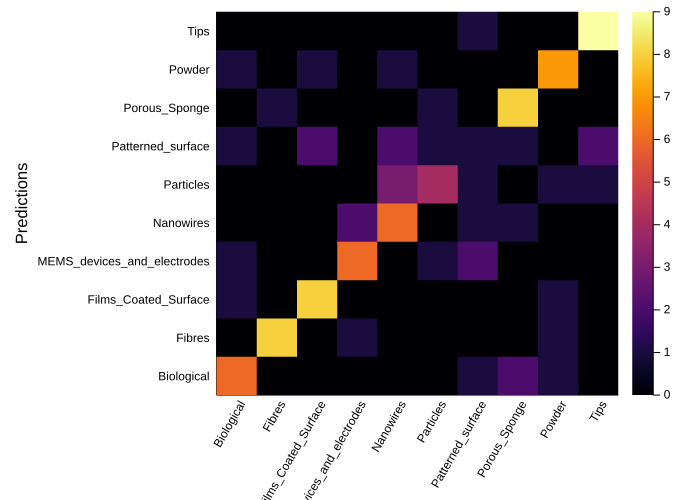

In [28]:
gr()
heatmap(assignment_list, assignment_list, cm, size = (700, 500), xrotation = 60, bottom_margin = 10mm,
    xlabel = "Ground Truths", ylabel = "Predictions")

On this tiny data set at least, it looks like by far the toughest to classify are patterned surfaces, which can be mistaken for a number of categories, including Nanowires, film-coated surfaces, and tips. <br><br>
But the sample size is too small and the model doesn't perform well enough to draw strong conclusions. Let's first try adding dropout

## With Dropout

In [29]:
@info("Constructing Model")
model = Chain(
    Conv((3,3), 1=>16, pad = (1,1), stride = (2,2), relu),
    MaxPool((2,2)),
    Conv((3,3), 16=>32, pad = (1,1), stride = (2,2), relu),
    MaxPool((2,2)),
    Conv((3,3), 32=>32, pad = (1,1), stride = (2,2), relu),
    MaxPool((2,2)),
    x -> reshape(x, :, size(x,4)),
    Dense(4608,10),
    Dropout(0.5),
    softmax,
)

┌ Info: Constructing Model
└ @ Main In[29]:1


Chain(Conv((3, 3), 1=>16, relu), MaxPool((2, 2), pad = (0, 0, 0, 0), stride = (2, 2)), Conv((3, 3), 16=>32, relu), MaxPool((2, 2), pad = (0, 0, 0, 0), stride = (2, 2)), Conv((3, 3), 32=>32, relu), MaxPool((2, 2), pad = (0, 0, 0, 0), stride = (2, 2)), #21, Dense(4608, 10), Dropout(0.5), softmax)

In [30]:
model(train_set[1][1])

10×32 Array{Float32,2}:
 0.0917864  0.0918573  0.0906153  …  0.0853451  0.0939104  0.0908554
 0.094468   0.0867877  0.0791994     0.0915928  0.0930687  0.0818112
 0.119856   0.128289   0.134539      0.12394    0.114627   0.127196 
 0.101767   0.100145   0.101532      0.105046   0.105604   0.102725 
 0.095896   0.0992732  0.0938143     0.0962767  0.0947283  0.100645 
 0.0906412  0.0904885  0.0953751  …  0.0930551  0.0924513  0.0900347
 0.103048   0.0987584  0.0960019     0.103832   0.105498   0.0935627
 0.087979   0.0951016  0.0913381     0.0899884  0.092111   0.095449 
 0.116084   0.115531   0.120008      0.11834    0.109856   0.118395 
 0.0984747  0.0937686  0.0975769     0.0925843  0.0981454  0.0993249

In [ ]:
train_model(loss, model, train_set, test_set, opt, "maxpool2.bson")

In [31]:
dropout_model = BSON.load("model_BSON_outputs/maxpool2.bson");

In [32]:
dropout_training_losses = dropout_model[:training_losses]
dropout_test_losses = dropout_model[:test_losses]
dropout_accs = dropout_model[:accuracies];

In [33]:
dropout_epochs = 1:length(dropout_training_losses)
dropout_normalized_training_losses = dropout_training_losses./maximum(dropout_training_losses)
dropout_normalized_test_losses = dropout_test_losses./maximum(dropout_test_losses)
plotly()
plot(dropout_epochs, [dropout_normalized_training_losses, dropout_normalized_test_losses, dropout_accs], title="SEM CNN Performance",
    label=["Normalized Training Loss" "Normalized Test Loss" "Test Accuracy"], left_margin = 5mm, xlabel = "Epoch", ylabel = "Value", lw=3)

<!DOCTYPE html>
 
 
 Plots.jl

In [34]:
trained_dropout_model = dropout_model[:model];

In [35]:
model_predictions = onecold(trained_dropout_model(test_set[1]))
ground_truths = onecold(test_set[2]);

In [36]:
cm = confusion_matrix(10, ground_truths, model_predictions)

10×10 Array{Int64,2}:
 7   0  0  0  0  1  1  1  0  0
 0  10  0  0  0  0  0  0  0  0
 0   0  9  0  0  0  0  0  1  0
 0   0  0  8  0  1  0  0  1  0
 0   0  0  1  8  0  0  1  0  0
 0   0  0  1  2  6  0  0  1  0
 0   0  2  0  1  1  4  1  0  1
 0   1  0  0  0  1  0  8  0  0
 0   0  1  0  0  0  0  1  8  0
 0   0  0  0  0  0  1  0  0  9

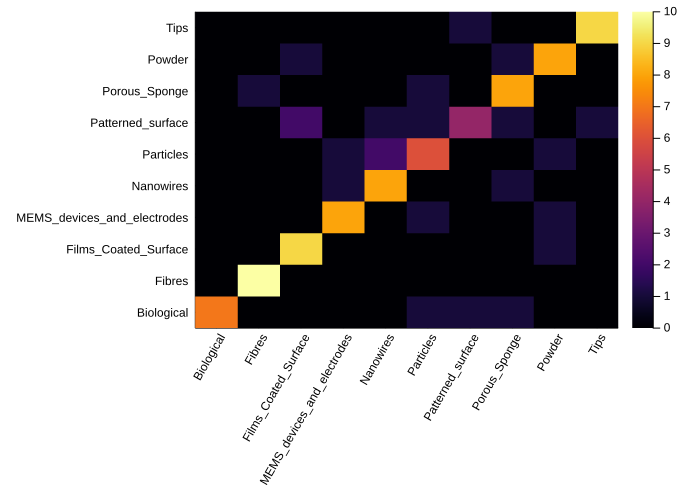

In [37]:
gr()
heatmap(assignment_list, assignment_list, cm, size = (700, 500), xrotation = 60, bottom_margin = 10mm)

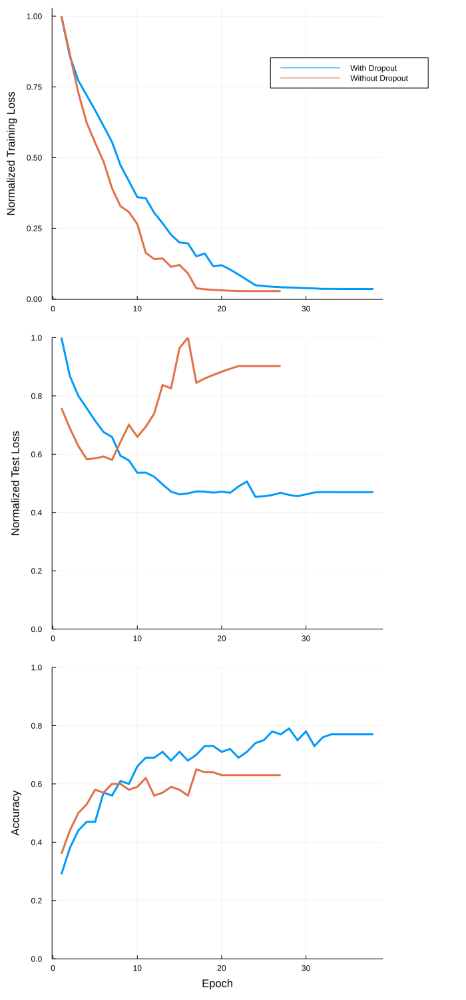

In [38]:
p1 = plot(dropout_epochs, dropout_normalized_training_losses,
    left_margin = 5mm, ylabel = "Normalized Training Loss", lw=3, size = (700,700))
p1 = plot!(epochs, normalized_training_losses, left_margin = 5mm, legend = false, lw=3)
p2 = plot(dropout_epochs, dropout_normalized_test_losses, ylim = (0.0, 1.0), left_margin = 5mm, ylabel = "Normalized Test Loss",
    lw=3, size = (700,700))
p2 = plot!(epochs, normalized_test_losses, left_margin = 5mm, lw=3)
p3 = plot(dropout_epochs, dropout_accs, left_margin = 5mm, ylim = (0.0, 1.0), xlabel = "Epoch", ylabel = "Accuracy", lw=3)
p3 = plot!(epochs, maxpool_accs, left_margin = 5mm, xlabel = "Epoch", lw=3, size = (700,700))
plots = plot(p1,p2,p3, layout = (3,1), bottom_margin = 5mm, legend = false, size = (700, 2100))
p_legend = plot((1:2)', legend = true, label = ["With Dropout" "Without Dropout"], framestyle = :none)
plot(plots, p_legend, layout = @layout([a b{0.1w}]), size = (700, 1500))

Sure enough, the model with dropout takes longer to fit the training data, and does much better on the test data, achieving 79%, which is decent for such a small training set. In order to do better we need more data.

# 5x the training data

In [39]:
train_images, train_labels, test_images, test_labels, assignment_dict = load_all(path, 0.9, 500);

100.0%┣██████████████████████████████████████████████████████████████┫ 11/11 [03:58<00:00, 0.0 it/s]


In [40]:
model_dict = BSON.load("SEM_convnet_best.bson")

Dict{Symbol,Any} with 5 entries:
  :accuracies    => Float32[0.778313, 0.787952, 0.785542, 0.814458, 0.816867, 0…
  :epoch_idx     => 7
  :training_loss => 39.5697
  :model         => Chain(Conv((3, 3), 1=>16, relu), MaxPool((2, 2), pad = (0, …
  :test_loss     => 0.610107

In [41]:
model = model_dict[:model]
model_predictions = onecold(model(test_set[1]))
ground_truths = onecold(test_set[2]);

In [42]:
R = confusion_matrix(10, ground_truths, model_predictions)

10×10 Array{Int64,2}:
 10   0  0  0  0  0  0   0   0   0
  0  10  0  0  0  0  0   0   0   0
  0   0  9  0  0  0  0   0   1   0
  0   0  0  8  0  0  1   0   1   0
  0   0  0  1  9  0  0   0   0   0
  0   0  0  0  0  9  1   0   0   0
  0   0  1  0  0  0  9   0   0   0
  0   0  0  0  0  0  0  10   0   0
  0   0  0  0  0  0  0   0  10   0
  0   0  0  0  0  0  0   0   0  10

In [43]:
v = @SVector [1/sum(R[i, :]) for i in 1:10]

10-element SArray{Tuple{10},Float64,1,10} with indices SOneTo(10):
 0.1
 0.1
 0.1
 0.1
 0.1
 0.1
 0.1
 0.1
 0.1
 0.1

In [44]:
R2 = R .* v;

In [45]:
show(IOContext(stdout, :limit=>false), MIME"text/plain"(), R2)

10×10 Array{Float64,2}:
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.9  0.0  0.0  0.0  0.0  0.0  0.1  0.0
 0.0  0.0  0.0  0.8  0.0  0.0  0.1  0.0  0.1  0.0
 0.0  0.0  0.0  0.1  0.9  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.9  0.1  0.0  0.0  0.0
 0.0  0.0  0.1  0.0  0.0  0.0  0.9  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0

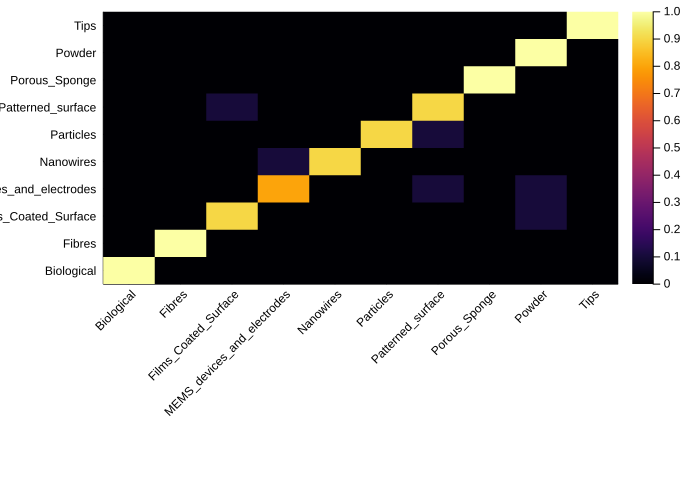

In [46]:
gr()
heatmap(assignment_list, assignment_list, R2, size = (700, 500), xrotation = 45)

Even on a smaller dataset of ~4,000 images, with a simple CNN training on a CPU, we get to 82.4% test accuracy. A deeper CNN with more compute resources for training should do much better